## Purpose:

In this notebook, we take our newly cleaned data and start exploring it. I hope to generate basic histograms and plots to summarize what we have.


In [1]:
#imports 
#Imports:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import pandas as pd
import numpy as np
import altair as alt
import matplotlib.pyplot as plt
import re
# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("."))

['Split-Apply-Combine.ipynb', '.git', 'req.txt', 'tests', 'src', 'readme.MD', 'notebooks', '__pycache__', 'Basic Stats & Visualizations.ipynb', 'Makefile', 'simplefront.py', 'web', 'Cleaning and Subsetting the ILS Dataset.ipynb', '.ipynb_checkpoints', 'Data Tidying.ipynb', 'data']


In [2]:
#settings:
#Settings:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"
alt.renderers.enable('notebook')
alt.data_transformers.enable('default', max_rows=None)
%matplotlib inline 
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 40)
pd.set_option('display.width', 1000)

In [3]:
dfILS = pd.read_csv("./data/results/ILS_clean.csv")


KeyboardInterrupt: 

In [20]:
dfILS["zipcode"].dtype

dtype('int64')

In [4]:
dfILS.head(5)
dfILS.shape
dfILS.describe()

,invoicenumber,date,city,zipcode,storenumber,countynumber,categorynumber,vendornumber,itemnumber,bottlevolumeml,statebottlecost,statebottleretail,bottlessold,saleprice,volumesoldlitre
0,S28865700001,11/09/2015,WATERLOO,50702,2538,7,1701100,962,238,1500,11.62,17.43,6,104.58,9
1,S29339300091,11/30/2015,MUSCATINE,52761,2662,70,1701100,65,173,750,19.58,29.37,4,117.48,3
2,S28866900001,11/11/2015,HOLSTEIN,51025,3650,47,1701100,962,238,1500,11.62,17.43,1,17.43,1
3,S29134300126,11/18/2015,ONAWA,51040,3723,67,1081200,305,258,6000,99.00,148.50,1,148.50,6
4,S29282800048,11/23/2015,PELLA,50219,2642,63,1701100,962,238,1500,11.62,17.43,6,104.58,9


(12488910, 15)

,zipcode,storenumber,countynumber,categorynumber,vendornumber,itemnumber,bottlevolumeml,statebottlecost,statebottleretail,bottlessold,saleprice,volumesoldlitre
count,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07,1.248891e+07
mean,5.126783e+04,3.560455e+03,5.724649e+01,1.044710e+06,2.574913e+02,4.594006e+04,9.293158e+02,9.648421e+00,1.449537e+01,8.136619e+00,1.165923e+02,7.181478e+00
std,9.892279e+02,9.286745e+02,2.727570e+01,5.437328e+04,1.416116e+02,5.223116e+04,7.356798e+02,1.139734e+01,1.709558e+01,2.221481e+01,3.851037e+02,2.689221e+01
min,5.000200e+04,2.106000e+03,1.000000e+00,1.011100e+06,1.000000e+01,1.010000e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,5.031600e+04,2.603000e+03,3.100000e+01,1.012210e+06,1.150000e+02,2.705600e+04,7.500000e+02,5.500000e+00,8.250000e+00,2.000000e+00,2.541000e+01,1.000000e+00
50%,5.110100e+04,3.700000e+03,6.200000e+01,1.031200e+06,2.600000e+02,3.817600e+04,7.500000e+02,7.960000e+00,1.195000e+01,4.000000e+00,6.714000e+01,3.000000e+00
75%,5.231000e+04,4.301000e+03,7.700000e+01,1.062310e+06,3.800000e+02,6.354500e+04,1.000000e+03,1.175000e+01,1.763000e+01,1.200000e+01,1.327200e+02,9.000000e+00
max,5.620100e+04,9.931000e+03,9.900000e+01,1.901200e+06,9.870000e+02,9.992750e+05,3.780000e+05,7.680000e+03,1.152000e+04,1.500000e+04,2.541000e+05,1.500000e+04


So we have over 12M entries. I'd like a box plot as the describe() method doesn't make things visually obvious. One thing we can do is distill all the unique points per catagory, and see the ranges.

For an Altair Box Plot, we choose a row catagory (X), and pick an attribute to focus on (Y). For every row of that catagory, the attribute will be picked out and used as a sample point for our boxplot. Our data has to be in a melted form, it seems.

In [4]:
#Lets make a box plot for all of our name-number catagories.
#"categorynumber""itemnumber"
types = ["storenumber","vendornumber","countynumber"]
N = 10000
numArr = np.zeros((30000,))
typeList = []

for i,item in enumerate(types):
    typeList.append([item] * N)
    numArr[i*N:(i+1)*N] = dfILS[item].sample(n=N).values

flatList = [val for sublist in typeList for val in sublist]
    

In [60]:
def filtoutliers(x,mean,sd,sigma):
    lB = mean - sigma*sd
    uB = mean + sigma*sd
    result = False
    if ((x >= lB) and (x<= uB)):
        result = True
    return result

#lets make a funciton that generates our dataframe for a particular column.
#pull 9998 points and add the max and the min
#get all unique values and generate for the plot, return a tuple of DFs
def gensampledf(colName,N,sig):
    numArr = np.zeros((N,))
    typeList = []
    
    if (N <= 2):
        return "N >=3! Input N too small."
    
    #first get our 10000 points. including max&min.
    #numArr[0] = dfILS[colName].max()
    #numArr[1] = dfILS[colName].min() screws up our graphs.
    #numArr[2:N] = dfILS[colName].sample(n=(N-2)).values
    hold = dfILS[colName].sample(n=N)

    binSelect = hold.apply(filtoutliers,args=(hold.mean(),hold.std(),sig))
    hold = hold[binSelect]
    
    typeList.append([colName+"_samples"] * hold.shape[0])
    flatList = [val for sublist in typeList for val in sublist]
                                     
    dfSample = pd.DataFrame({'catname':flatList, "points":hold})
                                     
    
    #now get unique values.
    uniques = pd.Series(dfILS[colName].unique())
    #return dfILS[colName].unique()
    binSelect = uniques.apply(filtoutliers,args=(uniques.mean(),uniques.std(),sig))
    uniques = uniques[binSelect]
    
    typeList = []
    typeList.append([colName+"_uniques"] * uniques.shape[0])
    flatList = [val for sublist in typeList for val in sublist]
                                     
    dfUnique = pd.DataFrame({'catname':flatList, "points":uniques})
    return pd.concat([dfSample,dfUnique]).reset_index(drop=True)

hold = gensampledf('itemnumber',10000,2.5)
hold


def prodchart(source):
    chart = alt.Chart(source).mark_boxplot(extent=1.5,size=35).encode(
        y='catname:O',
        x='points:Q',
        color="catname").properties(
        height=100, width=300)
    
    return chart

#mychart = prodchart(hold)

#gensampledf("vendornumber",10000)                         

ValueError: Cannot take a larger sample than population when 'replace=False'

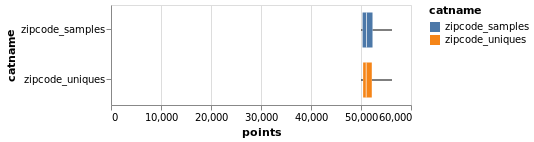

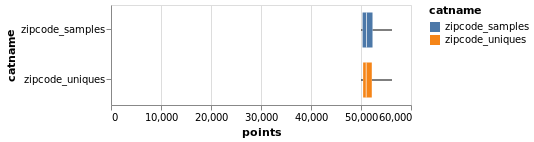

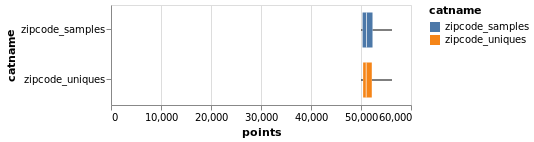

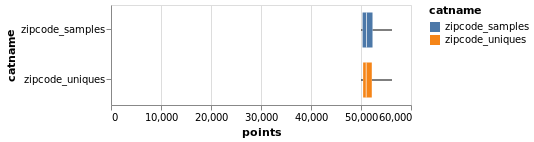

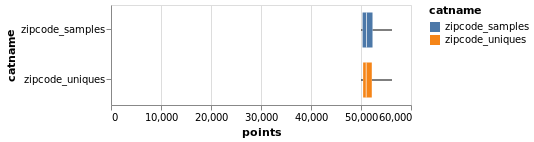

In [7]:
prodchart(gensampledf("zipcode",10000))
#mychart | mychart & mychart | mychart #this shows that and is before OR!

Outliers are ruining our superplot (below). For all of our cols, lets apply 5 sigma filtering, to cut out severe outliers.

I wanted to see my sample method vs the unique method. It seems the sample number (10000) is too low in many cases. 
I will stick with uniques for the final plot, and for my tableau export data frame. Proper scaling of each axis must also be done!

In [25]:
testDF = gensampledf("countynumber",10000,1)
testDF.shape

(6681, 2)

In [19]:
groupDF = testDF.groupby(["catname"])
print(groupDF)

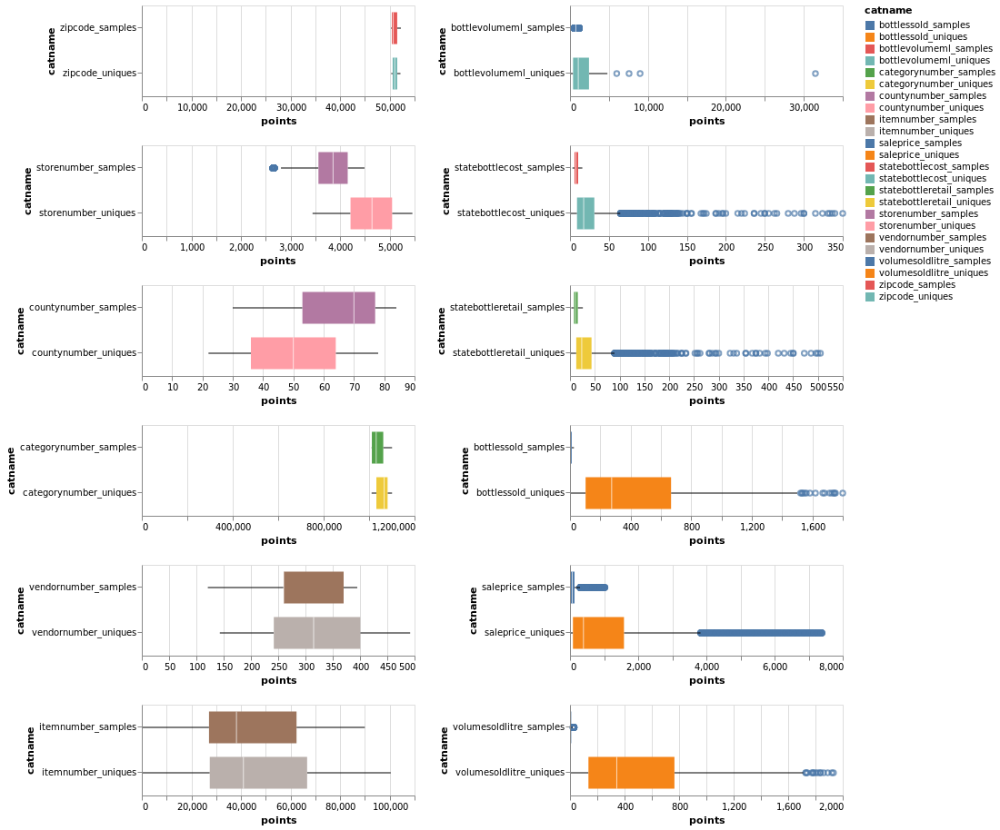

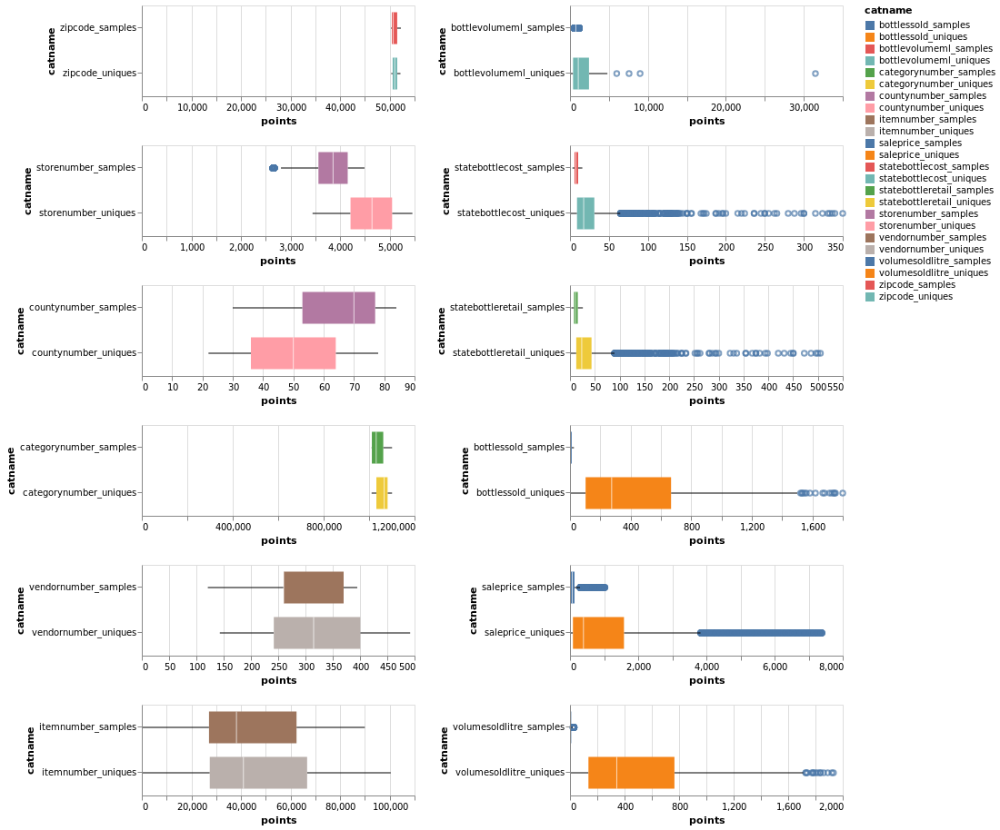

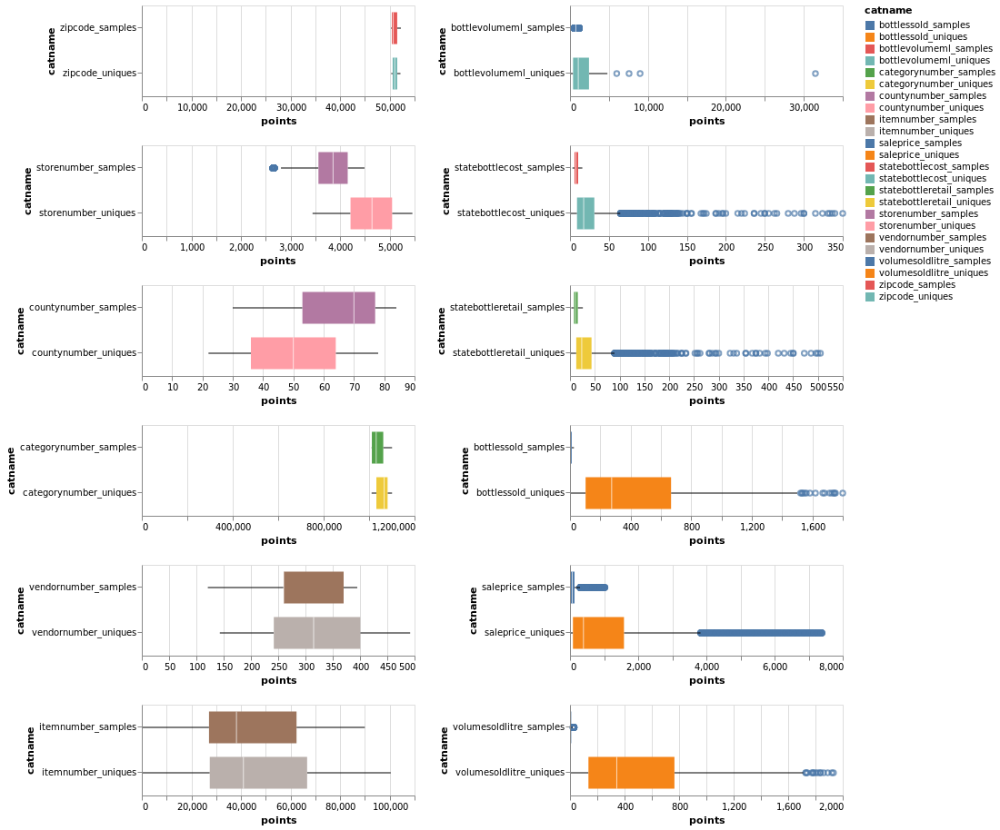

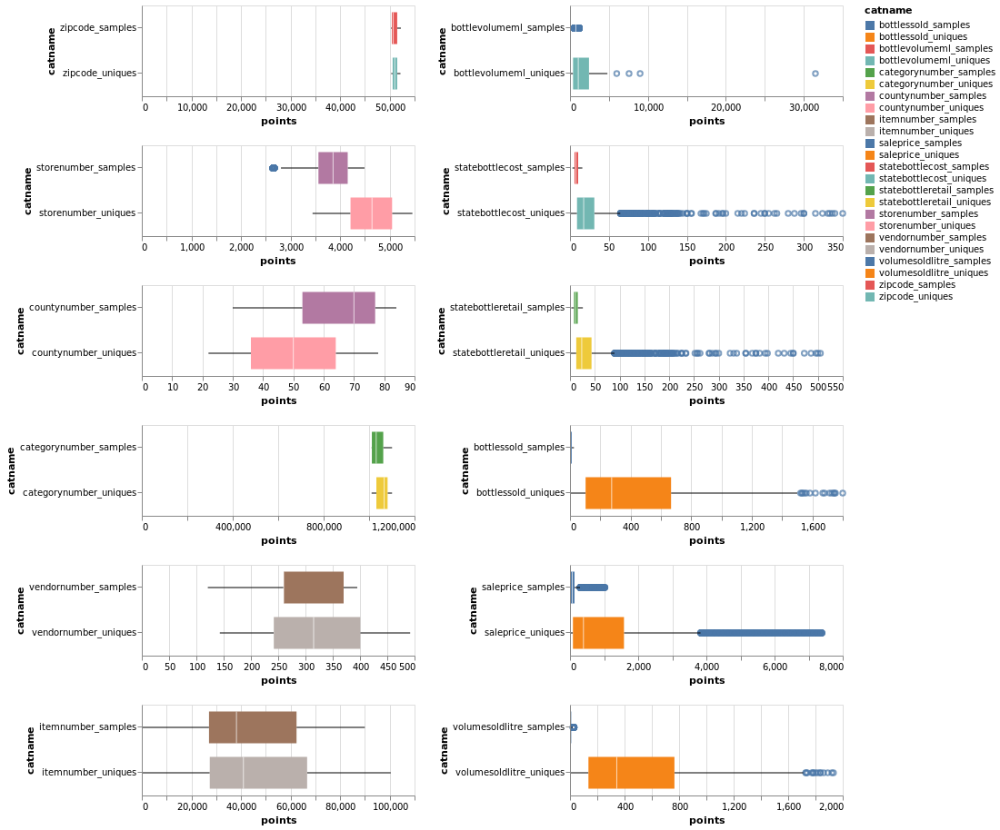

In [23]:
currentDF = gensampledf("zipcode",10000,2.5)        
finalChartL = prodchart(currentDF)

for i,item in enumerate(["storenumber","countynumber","categorynumber","vendornumber","itemnumber"]):
    currentDF = gensampledf(item,10000,2.5)
    
    currChart = prodchart(currentDF)
    finalChartL = finalChartL & currChart


currentDF = gensampledf("bottlevolumeml",10000,2.5)        
finalChartR = prodchart(currentDF)

for i,item in enumerate(['statebottlecost', 'statebottleretail', 'bottlessold', 'saleprice', 'volumesoldlitre']):
    currentDF = gensampledf(item,10000,2.5)        
    currChart = prodchart(currentDF)
    finalChartR = finalChartR & currChart

finalChartL | finalChartR 

We really should not be filtering at the data generation phase. Altair should do this for us. This makes our generation function more complicated. The distributions for each column also vary widely, so we need to be more careful about our analysis.

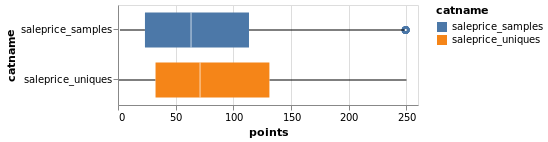

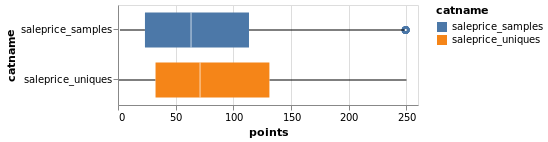

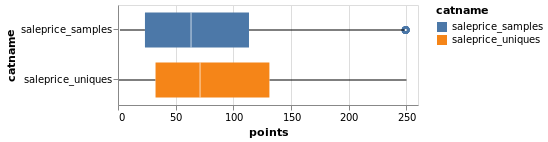

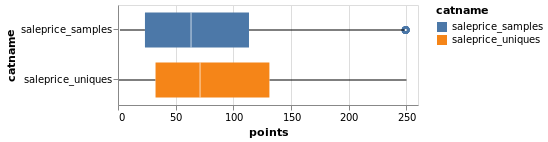

In [40]:
saleDF = gensampledf("saleprice",10000,5)

from altair import datum

def modprodchart(source):
    chart = alt.Chart(source).mark_boxplot(extent=1.5,size=35).encode(
        y='catname:O',
        x=alt.X('points:Q',scale=alt.Scale(zero=False)),
        color="catname").properties(
        height=100, width=300).transform_filter(
            alt.FieldRangePredicate(field='points', range=[0, 250]))
    
    return chart

modprodchart(saleDF)


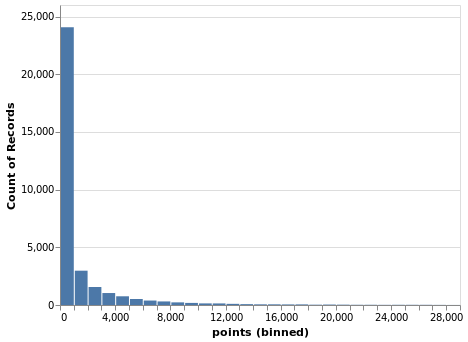

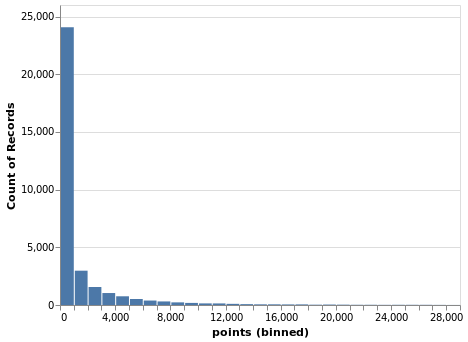

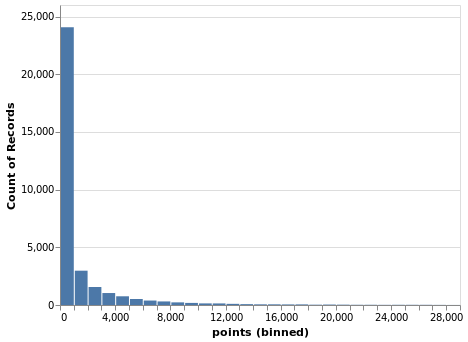

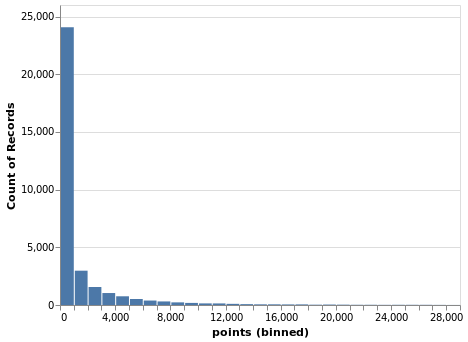

In [39]:
#our pathalogical example
alt.Chart(saleDF).mark_bar().encode(
    alt.X("points:Q", bin=alt.Bin(maxbins=50)),
    y='count()',
)

In [62]:
source = gensampledf("zipcode",10000,5)

alt.Chart(source).mark_boxplot(extent="min-max",size=35).encode(
        y='catname:O',
        x=alt.X('points:Q', scale=alt.Scale(zero=False,domain=[49000,54000])),
        color="catname").properties(
        height=100, width=300)

ValueError: Cannot take a larger sample than population when 'replace=False'

So we got our chart (above), working. I wish to design a general method to do the following:
    
1) For a given dataframe, pick out all of the numerical catagory columns.

2) For each column:
    
    a) Set scale domain to [-2.5IQR,+1.5IQR] and no zeros
    b) Plot [-1.5,1.5]IQR for our boxplot.
    c) Arrange in a stacked plot in a visually appealing way.

Other cases:

- If there are a large number of data points, take the uniques() instead.

- What about NAs? This method assumes NAs have been imputed or removed.

The idea is that we have a series of stacked plots we can look at all at once, to get an idea of the scaling of the
data. Before, massive outliers completely destroyed our box plots, so clipping the points is important

In [19]:
#Let's improve our code:
#Signature: DataFrame -> Dataframe
#Identify which columns are numerical, and return a DF that only includes them.
#Throws errors if NAs detected.
typeList=["float64","float32","float16","int64","int32","int16","int8"]

def idnumericals(dF):
    subsetL = []
    for col in dF.columns:
        if dF[col].dtype in typeList:
            subsetL.append(col)
            
    if (len(subsetL) == 0):
        raise Exception("No numerical columns detected!")
    if (dF.isnull().any().any()):
        raise ValueError('NAs detected in numeric cols of dataframe! Please remove them.')
    
    return dF[subsetL]

#MANUAL TEST:
#Testing the idnumericals function:
#dfILS = pd.read_csv("./data/results/ILS_clean.csv",nrows=50)
#idnumericals(dfILS)

#dfILS.loc[12,"storenumber"] = np.NaN
#idnumericals(dfILS)

#dfILS["storenumber"] = np.NaN
#idnumericals(dfILS)


,zipcode,storenumber,countynumber,categorynumber,vendornumber,itemnumber,bottlevolumeml,statebottlecost,statebottleretail,bottlessold,saleprice,volumesoldlitre
0,50702,2538,7,1701100,962,238,1500,11.62,17.43,6,104.58,9
1,52761,2662,70,1701100,65,173,750,19.58,29.37,4,117.48,3
2,51025,3650,47,1701100,962,238,1500,11.62,17.43,1,17.43,1
3,51040,3723,67,1081200,305,258,6000,99.00,148.50,1,148.50,6
4,50219,2642,63,1701100,962,238,1500,11.62,17.43,6,104.58,9
5,50517,3842,55,1701100,962,238,1500,11.62,17.43,3,52.29,4
6,50126,2539,42,1701100,962,238,1500,11.62,17.43,6,104.58,9
7,50208,4604,50,1701100,962,238,1500,11.62,17.43,2,34.86,3
8,50312,2248,77,1701100,65,173,750,19.58,29.37,36,1057.32,27
9,50138,2566,63,1701100,962,238,1500,11.62,17.43,12,209.16,18


In [4]:
dfILS = pd.read_csv("./data/results/ILS_clean.csv",nrows=100)

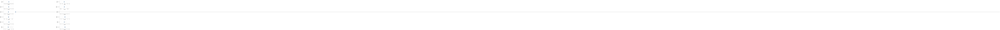

In [6]:
#Our main method we call.
#Will throw errors if NAs detected! 
#Signature: DF[DataFrame], Uniques[Boolean] -> AltairChart
#Takes a processed numerical series, and makes a boxplot of it.

typeList=["float64","float32","float16","int64","int32","int16","int8"]

def idnumericals(dF):
    subsetL = []
    for col in dF.columns:
        if dF[col].dtype in typeList:
            subsetL.append(col)
            
    if (len(subsetL) == 0):
        raise Exception("No numerical columns detected!")
    if (dF.isnull().any().any()):
        raise ValueError('NAs detected in numeric cols of dataframe! Please remove them.')
    
    return dF[subsetL]

def makeboxplotdf(numSer):
    return pd.DataFrame({'category':numSer.name, "numbers":numSer.values})

#Signature: DataFrame -> Chart
def createsubchart(source,scale):
    #titleStr = source.iloc[0,0] seems to be a weird bug with this.
    mean = source["numbers"].mean()
    irq = source["numbers"].quantile(0.75) - source["numbers"].quantile(0.25)
    domainL = [mean - irq*scale, mean + irq*scale]

    theChart = alt.Chart(source).mark_boxplot(extent="min-max",size=35).encode(
        y='category:O',
        x=alt.X('numbers:Q', scale=alt.Scale(domain=domainL))).properties(
        height=100, width=300)
            
    return theChart


def facetboxplot(dF,uniq=False):    
    #First, look for NAs and identify which columns are numerical.
    numDF = idnumericals(dF)
    
    #Calculate 2.5IQR both sides
    #Calculate 1.5IQR both sides
    
    #we need to separate our columns into two sets.
    colList = numDF.columns
    leftEvenL = []
    rightOddL = []
    
    for i,item in enumerate(colList):
        if (i % 2 == 0):
            leftEvenL.append(item)
        else:
            rightOddL.append(item)

    scale=2
            
    finalChartL = createsubchart(makeboxplotdf(numDF[leftEvenL.pop(0)]),scale)
    for col in leftEvenL:
        currChart = createsubchart(makeboxplotdf(numDF[col]),scale)
        finalChartL = finalChartL & currChart

        
    finalChartR = createsubchart(makeboxplotdf(numDF[rightOddL.pop(0)]),scale)
    for col in rightOddL:
        currChart = createsubchart(makeboxplotdf(numDF[col]),scale)
        finalChartR = finalChartR & currChart

    return (finalChartL | finalChartR)


#MANUAL TESTING:
dfILS = pd.read_csv("./data/results/ILS_clean.csv",nrows=20)
facetboxplot(dfILS)        

In [ ]:
    theChart = alt.Chart(source).mark_boxplot(extent="min-max",size=35).encode(
        y='category:O',
        x=alt.X('numbers:Q', scale=alt.Scale(zero=False, domain=domainL))).properties(
        height=100, width=300)

finalChartL = createsubchart(numDF)
    for i,item in enumerate(leftEvenL):
        currChart = createsubchart(numDF)
        finalChartL = finalChartL & currChart


    finalChartR = createsubchart(numDF)
    for i,item in enumerate(rightOddL):
        currChart = createsubchart(numDF)
        finalChartR = finalChartR & currChart

    return (finalChartL | finalChartR)


currentDF = gensampledf("bottlevolumeml",10000,2.5)        
finalChartR = prodchart(currentDF)

for i,item in enumerate(['statebottlecost', 'statebottleretail', 'bottlessold', 'saleprice', 'volumesoldlitre']):
    currentDF = gensampledf(item,10000,2.5)        
    currChart = prodchart(currentDF)
    finalChartR = finalChartR & currChart

finalChartL | finalChartR 

In [ ]:
#Signature: DataFrame -> Chart
def createsubchart(source):
    theChart = alt.Chart(source).mark_boxplot(extent="min-max",size=35).encode(
        y='catname:O',
        x=alt.X('points:Q', scale=alt.Scale(zero=False,domain=[49000,54000])),
        color="catname").properties(
        height=100, width=300)
    return theChart

In [ ]:
    #check if uniques is set.
    if (uniq == True):
        
    elif (uniq == False):

    else:
        raise ValueError("The unique parameter was not set with a boolean value.")
